In [1]:
from scipy.cluster.hierarchy import dendrogram,linkage
from copy import deepcopy 
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import os 

In [2]:
plt.rcParams['figure.figsize']= (20,10)
plt.style.use('ggplot')
pd.set_option('display.width',2000)

In [4]:
#os.chdir('C:\\Users\\Hp\\Desktop\\Pyt_language\\machine-learning\\Unsuperwise machinelearning')
df = pd.read_csv('movie_metadata.csv')
df.head()

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,...,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723,178,0,855,Joel David Moore,1000,760505847,Action|Adventure|Fantasy|Sci-Fi,...,3054,English,USA,PG-13,237000000,2009,936,7.9,1.78,33000
1,Color,Gore Verbinski,302,169,563,1000,Orlando Bloom,40000,309404152,Action|Adventure|Fantasy,...,1238,English,USA,PG-13,300000000,2007,5000,7.1,2.35,0
2,Color,Sam Mendes,602,148,0,161,Rory Kinnear,11000,200074175,Action|Adventure|Thriller,...,994,English,UK,PG-13,245000000,2015,393,6.8,2.35,85000
3,Color,Christopher Nolan,813,164,22000,23000,Christian Bale,27000,448130642,Action|Thriller,...,2701,English,USA,PG-13,250000000,2012,23000,8.5,2.35,164000
4,49,Doug Walker,49,49,131,49,Rob Walker,131,49,Documentary,...,49,49,49,49,49,49,12,7.1,49.00,0


In [5]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)
df

,color,director_name,num_critic_for_reviews,duration,director_facebook_likes,actor_3_facebook_likes,actor_2_name,actor_1_facebook_likes,gross,genres,actor_1_name,movie_title,num_voted_users,cast_total_facebook_likes,actor_3_name,facenumber_in_poster,plot_keywords,movie_imdb_link,num_user_for_reviews,language,country,content_rating,budget,title_year,actor_2_facebook_likes,imdb_score,aspect_ratio,movie_facebook_likes
0,Color,James Cameron,723,178,0,855,Joel David Moore,1000,760505847,Action|Adventure|Fantasy|Sci-Fi,CCH Pounder,Avatar,886204,4834,Wes Studi,0,avatar|future|marine|native|paraplegic,http://www.imdb.com/title/tt0499549/?ref_=fn_t...,3054,English,USA,PG-13,237000000,2009,936,7.9,1.78,33000
1,Color,Gore Verbinski,302,169,563,1000,Orlando Bloom,40000,309404152,Action|Adventure|Fantasy,Johnny Depp,Pirates of the Caribbean: At World's End,471220,48350,Jack Davenport,0,goddess|marriage ceremony|marriage proposal|pi...,http://www.imdb.com/title/tt0449088/?ref_=fn_t...,1238,English,USA,PG-13,300000000,2007,5000,7.1,2.35,0
2,Color,Sam Mendes,602,148,0,161,Rory Kinnear,11000,200074175,Action|Adventure|Thriller,Christoph Waltz,Spectre,275868,11700,Stephanie Sigman,1,bomb|espionage|sequel|spy|terrorist,http://www.imdb.com/title/tt2379713/?ref_=fn_t...,994,English,UK,PG-13,245000000,2015,393,6.8,2.35,85000
3,Color,Christopher Nolan,813,164,22000,23000,Christian Bale,27000,448130642,Action|Thriller,Tom Hardy,The Dark Knight Rises,1144337,106759,Joseph Gordon-Levitt,0,deception|imprisonment|lawlessness|police offi...,http://www.imdb.com/title/tt1345836/?ref_=fn_t...,2701,English,USA,PG-13,250000000,2012,23000,8.5,2.35,164000
4,49,Doug Walker,49,49,131,49,Rob Walker,131,49,Documentary,Doug Walker,Star Wars: Episode VII - The Force Awakens ...,8,143,49,0,49,http://www.imdb.com/title/tt5289954/?ref_=fn_t...,49,49,49,49,49,49,12,7.1,49.00,0
5,Color,Andrew Stanton,462,132,475,530,Samantha Morton,640,73058679,Action|Adventure|Sci-Fi,Daryl Sabara,John Carter,212204,1873,Polly Walker,1,alien|american civil war|male nipple|mars|prin...,http://www.imdb.com/title/tt0401729/?ref_=fn_t...,738,English,USA,PG-13,263700000,2012,632,6.6,2.35,24000
6,Color,Sam Raimi,392,156,0,4000,James Franco,24000,336530303,Action|Adventure|Romance,J.K. Simmons,Spider-Man 3,383056,46055,Kirsten Dunst,0,sandman|spider man|symbiote|venom|villain,http://www.imdb.com/title/tt0413300/?ref_=fn_t...,1902,English,USA,PG-13,258000000,2007,11000,6.2,2.35,0
7,Color,Nathan Greno,324,100,15,284,Donna Murphy,799,200807262,Adventure|Animation|Comedy|Family|Fantasy|Musi...,Brad Garrett,Tangled,294810,2036,M.C. Gainey,1,17th century|based on fairy tale|disney|flower...,http://www.imdb.com/title/tt0398286/?ref_=fn_t...,387,English,USA,PG,260000000,2010,553,7.8,1.85,29000
8,Color,Joss Whedon,635,141,0,19000,Robert Downey Jr.,26000,458991599,Action|Adventure|Sci-Fi,Chris Hemsworth,Avengers: Age of Ultron,462669,92000,Scarlett Johansson,4,artificial intelligence|based on comic book|ca...,http://www.imdb.com/title/tt2395427/?ref_=fn_t...,1117,English,USA,PG-13,250000000,2015,21000,7.5,2.35,118000
9,Color,David Yates,375,153,282,10000,Daniel Radcliffe,25000,301956980,Adventure|Family|Fantasy|Mystery,Alan Rickman,Harry Potter and the Half-Blood Prince,321795,58753,Rupert Grint,3,blood|book|love|potion|professor,http://www.imdb.com/title/tt0417741/?ref_=fn_t...,973,English,UK,PG,250000000,2009,11000,7.5,2.35,10000


In [6]:
df.shape

(5043, 28)

In [7]:
df.columns

Index(['color', 'director_name', 'num_critic_for_reviews', 'duration', 'director_facebook_likes', 'actor_3_facebook_likes', 'actor_2_name', 'actor_1_facebook_likes', 'gross', 'genres', 'actor_1_name', 'movie_title', 'num_voted_users', 'cast_total_facebook_likes', 'actor_3_name', 'facenumber_in_poster', 'plot_keywords', 'movie_imdb_link', 'num_user_for_reviews', 'language', 'country', 'content_rating', 'budget', 'title_year', 'actor_2_facebook_likes', 'imdb_score', 'aspect_ratio', 'movie_facebook_likes'], dtype='object')

In [8]:
df[['actor_1_facebook_likes','actor_1_name']]

,actor_1_facebook_likes,actor_1_name
0,1000,CCH Pounder
1,40000,Johnny Depp
2,11000,Christoph Waltz
3,27000,Tom Hardy
4,131,Doug Walker
5,640,Daryl Sabara
6,24000,J.K. Simmons
7,799,Brad Garrett
8,26000,Chris Hemsworth
9,25000,Alan Rickman


In [9]:
f1 = df['budget'].values
f2 = df['gross'].values
fb = f1[0:100]
fg = f2[0:100]

In [10]:
df['budget']

0         237000000
1         300000000
2         245000000
3         250000000
4                49
5         263700000
6         258000000
7         260000000
8         250000000
9         250000000
10        250000000
11        209000000
12        200000000
13        225000000
14        215000000
15        225000000
16        225000000
17        220000000
18        250000000
19        225000000
20        250000000
21        230000000
22        200000000
23        225000000
24        180000000
25        207000000
26        200000000
27        250000000
28        209000000
29        150000000
30        200000000
31        200000000
32        200000000
33        200000000
34        210000000
35        200000000
36        200000000
37        210000000
38        215000000
39        200000000
40        170000000
41        200000000
42        200000000
43        200000000
44        200000000
45        190000000
46        190000000
47        200000000
48        190000000
49        195000000


In [11]:
df['gross']

0       760505847
1       309404152
2       200074175
3       448130642
4              49
5        73058679
6       336530303
7       200807262
8       458991599
9       301956980
10      330249062
11      200069408
12      168368427
13      423032628
14       89289910
15      291021565
16      141614023
17      623279547
18      241063875
19      179020854
20      255108370
21      262030663
22      105219735
23      258355354
24       70083519
25      218051260
26      658672302
27      407197282
28       65173160
29      652177271
30      304360277
31      373377893
32      408992272
33      334185206
34      234360014
35      268488329
36      402076689
37      245428137
38      234903076
39      202853933
40      172051787
41      191450875
42      116593191
43      414984497
44      125320003
45      350034110
46      202351611
47      233914986
48      228756232
49       65171860
50      144812796
51       90755643
52      101785482
53      352358779
54      317011114
55      12

In [15]:
fb 

array([237000000, 300000000, 245000000, 250000000,        49, 263700000,
       258000000, 260000000, 250000000, 250000000, 250000000, 209000000,
       200000000, 225000000, 215000000, 225000000, 225000000, 220000000,
       250000000, 225000000, 250000000, 230000000, 200000000, 225000000,
       180000000, 207000000, 200000000, 250000000, 209000000, 150000000,
       200000000, 200000000, 200000000, 200000000, 210000000, 200000000,
       200000000, 210000000, 215000000, 200000000, 170000000, 200000000,
       200000000, 200000000, 200000000, 190000000, 190000000, 200000000,
       190000000, 195000000, 105000000, 200000000, 190000000, 195000000,
       185000000,        49, 185000000, 185000000, 180000000, 140000000,
       200000000, 200000000, 176000000, 180000000, 180000000, 178000000,
       185000000, 175000000, 175000000, 140000000, 170000000, 170000000,
       145000000, 175000000, 175000000, 178000000, 175000000, 175000000,
       175000000, 175000000, 200000000, 170000000, 

In [16]:
fg

array([760505847, 309404152, 200074175, 448130642,        49,  73058679,
       336530303, 200807262, 458991599, 301956980, 330249062, 200069408,
       168368427, 423032628,  89289910, 291021565, 141614023, 623279547,
       241063875, 179020854, 255108370, 262030663, 105219735, 258355354,
        70083519, 218051260, 658672302, 407197282,  65173160, 652177271,
       304360277, 373377893, 408992272, 334185206, 234360014, 268488329,
       402076689, 245428137, 234903076, 202853933, 172051787, 191450875,
       116593191, 414984497, 125320003, 350034110, 202351611, 233914986,
       228756232,  65171860, 144812796,  90755643, 101785482, 352358779,
       317011114, 123070338, 237282182, 130468626, 223806889, 140080850,
       166112167, 137850096,  47375327, 124051759, 291709845, 154985087,
       533316061, 292979556, 198332128, 318298180,  73820094, 113745408,
       102176165, 161087183, 100289690, 100189501,  88246220, 150167630,
       356454367, 362645141, 312057433, 155111815, 

In [17]:
x = np.array(list(zip(fb,fg)))
x

array([[237000000, 760505847],
       [300000000, 309404152],
       [245000000, 200074175],
       [250000000, 448130642],
       [       49,        49],
       [263700000,  73058679],
       [258000000, 336530303],
       [260000000, 200807262],
       [250000000, 458991599],
       [250000000, 301956980],
       [250000000, 330249062],
       [209000000, 200069408],
       [200000000, 168368427],
       [225000000, 423032628],
       [215000000,  89289910],
       [225000000, 291021565],
       [225000000, 141614023],
       [220000000, 623279547],
       [250000000, 241063875],
       [225000000, 179020854],
       [250000000, 255108370],
       [230000000, 262030663],
       [200000000, 105219735],
       [225000000, 258355354],
       [180000000,  70083519],
       [207000000, 218051260],
       [200000000, 658672302],
       [250000000, 407197282],
       [209000000,  65173160],
       [150000000, 652177271],
       [200000000, 304360277],
       [200000000, 373377893],
       [

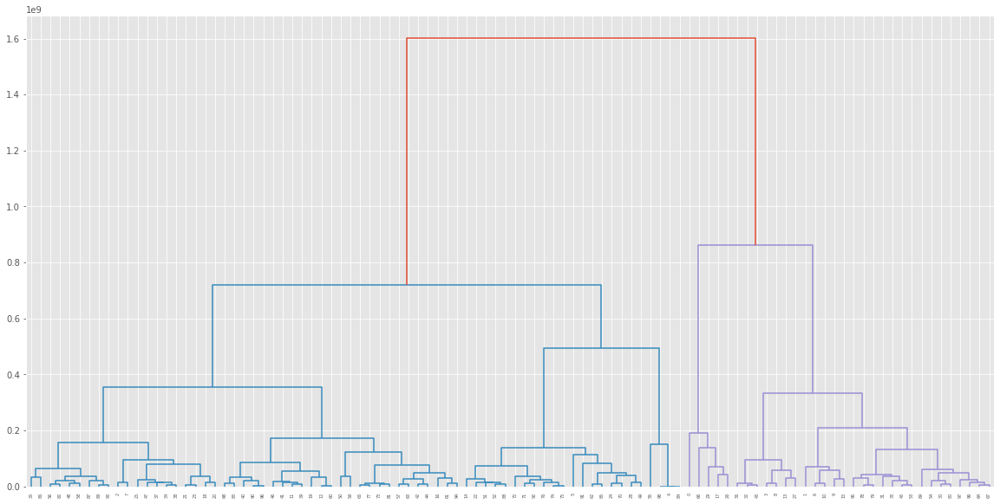

In [18]:
x = np.array(list(zip(fb,fg)))
z = linkage(x,'ward')
fig = plt.figure(figsize = (20,10))
dn = dendrogram(z)

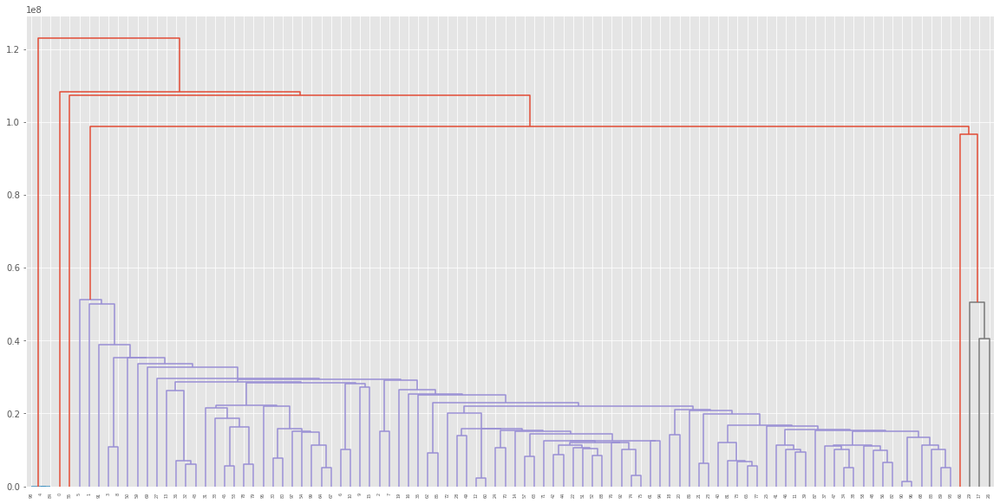

In [32]:
z = linkage(x,'single')
fig = plt.figure(figsize = (20,10))
dn = dendrogram (z)
plt.show()

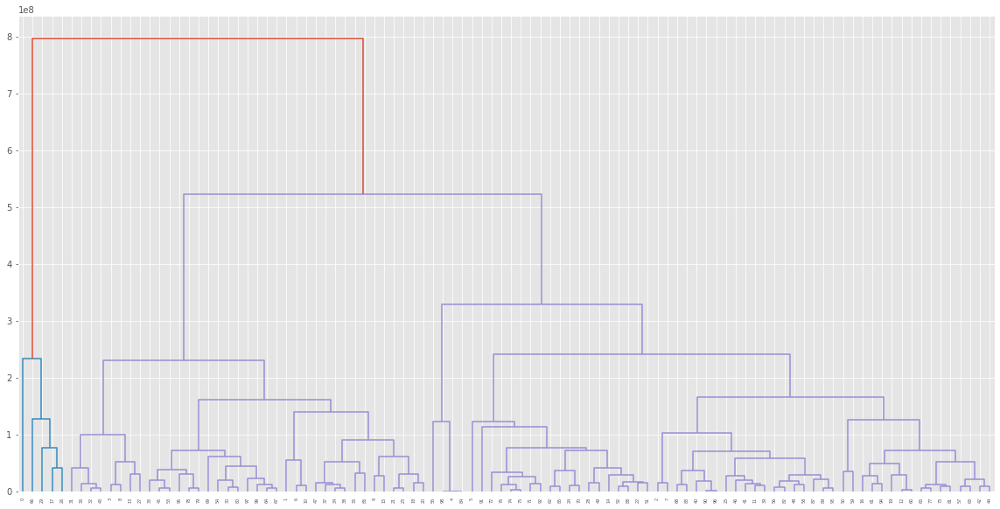

In [33]:
z = linkage(x,'complete')
fig = plt.figure(figsize = (20,10))
dn = dendrogram (z)
plt.show()

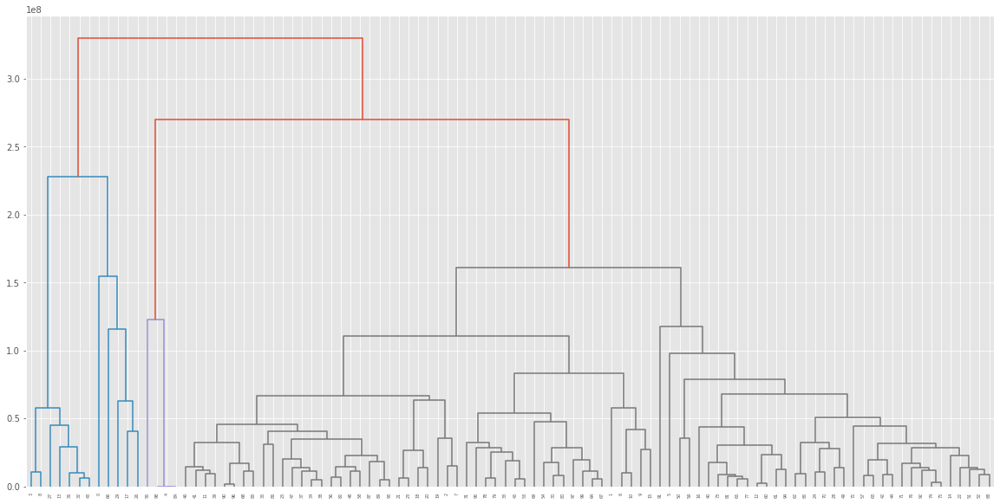

In [34]:
x = np.array(list(zip(fb,fg)))
z = linkage(x,'average')
fig = plt.figure(figsize = (20,10))
dn = dendrogram(z)